# Imports

In [1]:
# Standard python library-imports
import os
import dill as pickle
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

# directory
notebook_dir = os.getcwd()
current_dir ='../../../../'
os.chdir(current_dir)
# os.getcwd()

In [2]:
from src.codes.basic import *
from src.codes.utils.fem_utils_StrucMech import *
from src.codes.utils.plot_files.plot_utils import OneDPlot as plot
from src.codes.utils.plot_files.plot_utils import data_stats
from src.codes.utils.rom_utils import *
from src.codes.utils.dynamical_systems import *
import time as time

from src.codes.prob_classes.structural_mechanics.base_class_struc_mech_continuous_vibration import ROM_simulation_p
from src.codes.algorithms.ecsw import ecsw_red
from src.codes.algorithms.ecsw import ecsw_red_SS_parametric


---

### Epistemic Uncertainty[Number of snapshots]

In [3]:
Model_error_d = []
Model_error_v = []

Model_error_ROM_d = []
Model_error_ROM_v = []

### Train-Test split

In [4]:
# NLS_test = np.load(notebook_dir+'/data/test_data.npy')
# param_list_test = np.load(notebook_dir+'/data/param_list_test.npy')

##### Parameters

In [5]:
T = 2 / (2 * np.pi)  # Period of the vibration
s_param = (-2**(-0.5)+0.5, 0.0) # For F
tau_param = (T/20, T/2) # For K

param_ranges = [tau_param, s_param]
method = 'sobol'

In [6]:
p=3
# N_snap = 2

In [7]:
p+=1
N_snap=2**p
print(N_snap)

16


### Generate Training datasets using different distribution

In [8]:
import numpy as np
from tests_.UQ.VIBRATION.oneD_beam.data_gen_UQ import UQ_data_gen

# from src.codes.prob_classes.structural_mechanics.base_class_struc_mech_NL_static_axial import ROM_simulation_UQ

# Step 2: Modify the parameter
# Specify mean and standard deviation

# filename_dataC = f'data/DataClass_UQ_DYNAMIC_NL_{N_snap}_{method}.dill'
filename_dataC = f'data/Test_params_16_tau_s_{N_snap}_{method}.dill'

c:\Users\suparnob\OneDrive - Texas A&M University\Academic\TAMU_MATERIALS\POSTDOC\HYPERREDUCTION\SUPARNO\HYPERREDUCTION__TAMIDS\pyHyperRom
Changed working directory to: c:\Users\suparnob\OneDrive - Texas A&M University\Academic\TAMU_MATERIALS\POSTDOC\HYPERREDUCTION\SUPARNO\HYPERREDUCTION__TAMIDS\pyHyperRom\tests_\UQ\VIBRATION\oneD_beam\..\..\..\..


In [9]:
# filename_dataC = f'data/training_data.dill'
# generate = True

if os.path.exists(notebook_dir+'/'+filename_dataC):

    generate = False

    with open(notebook_dir+'/'+filename_dataC, 'rb') as f:
        Data_cls = pickle.load(f)

else:
    
    generate = True
    params = generate_sobol(len(param_ranges), N_snap, param_ranges)
    print(params)

# generate_gaussian_samples
# generate_sobol

In [10]:
if(generate):
    tic = time.time()
    Data_cls = UQ_data_gen(params,filename_dataC)
    toc = time.time()
    fom_time = toc-tic

In [13]:
FOS = Data_cls.FOS
d = FOS.data
mask_dv = np.append(d.mask, d.mask)

param_list = np.asarray(Data_cls.param_list)
NLS = np.asarray(Data_cls.NL_solutions)

K_mus = Data_cls.K_mus
C_mus = Data_cls.C_mus
t = Data_cls.t
q_mus = Data_cls.q_mus
T = Data_cls.T

# Load HFS data

In [14]:
## Details of the data
print(f"Total number of datasets {len(NLS)}")

N_params = NLS.shape[0]
N_dim = NLS.shape[1]
nt = NLS.shape[2]

NLS.shape

Total number of datasets 16


(16, 1004, 5001)

---

# Clustering Data

In [15]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [16]:
flattened_all_matrices = np.array([m.flatten() for m in NLS])
# flattened_all_matrices.shape

In [17]:
# Generate the linkage matrix using Ward's method
Z_all = linkage(flattened_all_matrices, method='ward')

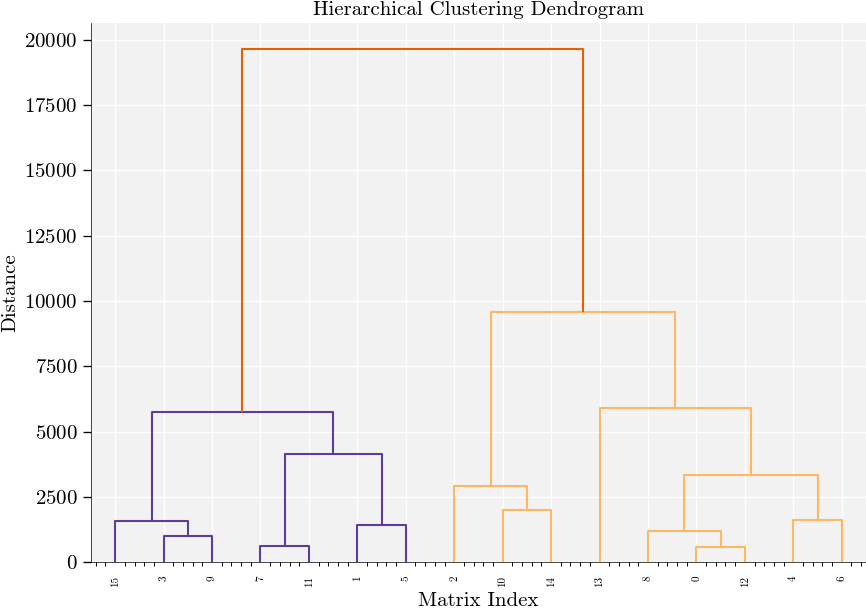

In [18]:
# Plot the dendrogram for the new set of matrices
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram')
dendrogram(
    Z_all,
    leaf_rotation=90.,
    leaf_font_size=8.,
)
plt.xlabel('Matrix Index')
plt.ylabel('Distance')
plt.show()

In [19]:
max_d = 60000  # for example, adjust based on your dendrogram # Decide on a threshold distance to determine the clusters, then assign matrices to clusters
clusters = fcluster(Z_all, max_d, criterion='distance')

NLS_cl = [[] for _ in range(clusters.max())]
param_cl = [[] for _ in range(clusters.max())]
K_mus_cl = [[] for _ in range(clusters.max())]
q_mus_cl = [[] for _ in range(clusters.max())]
C_mus_cl = [[] for _ in range(clusters.max())]

# Print cluster assignments
for i, cluster in enumerate(clusters):
    print(f"Matrix {i} belongs to cluster {cluster}")
    NLS_cl[cluster-1].append(NLS[i,:,:])
    param_cl[cluster-1].append(param_list[i])
    K_mus_cl[cluster-1].append(K_mus[i])
    q_mus_cl[cluster-1].append(q_mus[i])
    C_mus_cl[cluster-1].append(C_mus[i])

Matrix 0 belongs to cluster 1
Matrix 1 belongs to cluster 1
Matrix 2 belongs to cluster 1
Matrix 3 belongs to cluster 1
Matrix 4 belongs to cluster 1
Matrix 5 belongs to cluster 1
Matrix 6 belongs to cluster 1
Matrix 7 belongs to cluster 1
Matrix 8 belongs to cluster 1
Matrix 9 belongs to cluster 1
Matrix 10 belongs to cluster 1
Matrix 11 belongs to cluster 1
Matrix 12 belongs to cluster 1
Matrix 13 belongs to cluster 1
Matrix 14 belongs to cluster 1
Matrix 15 belongs to cluster 1


#### Visualize clustered data

(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)
(1004, 201)


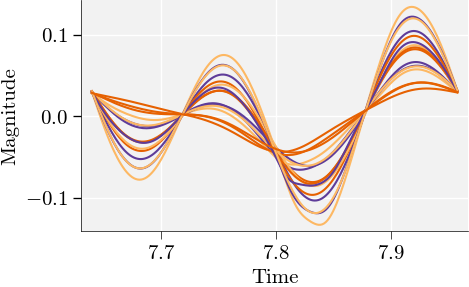

In [20]:
ntd = 200+1
for i in range(clusters.max()):

    fig,ax = plt.subplots(figsize=(5,3))
    data_col = 150
    # len(NLS)
    for j in range(0,len(NLS_cl[i])):
        solution_snapshot_f_nset0 = NLS_cl[i][j][:,nt-ntd:nt]
        print(solution_snapshot_f_nset0.shape)
        ax.plot(t[-ntd:], solution_snapshot_f_nset0[data_col,:])

    plt.xlabel("Time")
    plt.ylabel("Magnitude")
    plt.show()

# Process Data

##### DOF selection

In [21]:
# # Assuming 'original_array' has shape (9, 404, 5001)
# # Transpose to switch dimensions to (9, 5001, 404), preparing for the vertical stack
# Data=NLS_cl.transpose(0, 2, 1)

# # Reshape to stack vertically, which now simply flattens the first two dimensions
# solution_snapshot_orig = Data.reshape(-1, Data.shape[-1])

cluster = 0

solution_snapshot_orig = NLS_cl[cluster][0].T

N_params = len(NLS_cl[cluster])
N_dim = solution_snapshot_orig.shape[1]
nt = solution_snapshot_orig.shape[0]

for i in range(1,N_params):
    solution_snapshot_orig = np.vstack([solution_snapshot_orig,NLS_cl[cluster][i].T])


solution_snapshot_orig = solution_snapshot_orig[:,mask_dv]

##### Size of the data

In [22]:
solution_snapshot_orig.shape # (N_params x nt) x n_dim

(80016, 1000)

#### Visualize

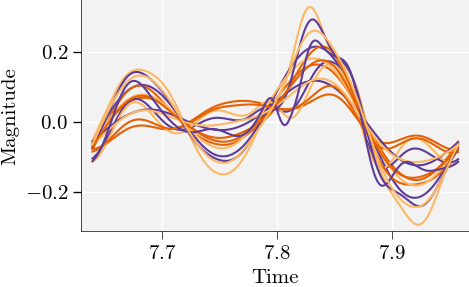

In [23]:
fig,ax = plt.subplots(figsize=(5,3))
data_col = 350
# len(NLS)
for i in range(1,N_params):
    solution_snapshot_f_nset0 = solution_snapshot_orig[(i)*(nt)-ntd:(i)*(nt),:]
    ax.plot(t[-ntd:], solution_snapshot_f_nset0[:,data_col])

plt.xlabel("Time")
plt.ylabel("Magnitude")
plt.show()

In [24]:
#  solution_snapshot_f_nset0[:,180]

---

##### Temporal processing

In [ ]:
# scaling_location = notebook_dir+'\\data\\'+'scaling_params\\'
# scaling_fileName = scaling_location+'scaling_params'
# if not os.path.isdir(scaling_location):
#     os.mkdir(scaling_location)

In [25]:
solution_snapshot_f, nt, fs, tstop, ndata, nset, tn, q_mus_truncated = fom_data_processor_stacked_q(t, T, solution_snapshot_orig, q_mus_cl[cluster])

##### Size

In [26]:
# q_mus_truncated[0][0].shape

#### Visualize

**A**

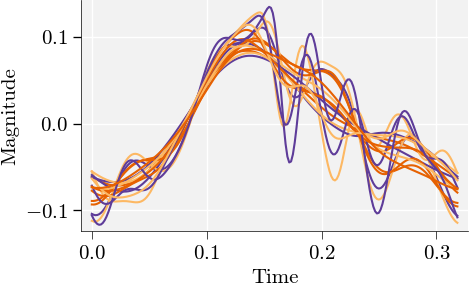

In [27]:
fig,ax = plt.subplots(figsize=(5,3))
# len(NLS)
solution_snapshot_f_nset=np.zeros((N_params,nt,solution_snapshot_f.shape[-1]))

for i in range(N_params):
    solution_snapshot_f_nset[i] = solution_snapshot_f[i*nt:(i+1)*nt,:]
    ax.plot(tn, solution_snapshot_f_nset[i][:,380])

plt.xlabel("Time")
plt.ylabel("Magnitude")
plt.show()


**B**

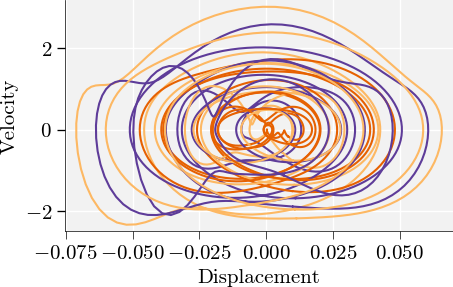

In [28]:
fig,ax = plt.subplots(figsize=(5,3))
# len(NLS)

for i in range(N_params):
    # solution_snapshot_f_nset = solution_snapshot_f[i*nt:(i+1)*nt,:]
    ax.plot(solution_snapshot_f_nset[i][:,41],solution_snapshot_f_nset[i][:,543])

plt.xlabel("Displacement")
plt.ylabel("Velocity")
plt.show()


In [ ]:
# Save the data set
solution_snapshot_f_test = solution_snapshot_f[]

os.chdir(notebook_dir)
np.save(f'data/snapshots_p_{len(param_cl[cluster])}params.npy',solution_snapshot_f)
np.save(f'data/params_{len(param_cl[cluster])}.npy',param_cl[cluster])

---

## ECSW Hyper-reduction

### Train-Test split

In [31]:
train_mask_t, _ = sobol_train_test_split(nt, train_percentage = 0.5)

In [32]:
solution_snapshot_ecsw=np.zeros((N_params,len(train_mask_t[train_mask_t==True]),solution_snapshot_f.shape[-1]))
solution_snapshot_ecsw_disp_svd = solution_snapshot_f[:nt,:][train_mask_t]

for i in range(1,N_params):
    solution_snapshot_ecsw[i] = solution_snapshot_f[i*nt:(i+1)*nt,:][train_mask_t]
    solution_snapshot_ecsw_da_svd = np.vstack([solution_snapshot_ecsw_disp_svd, solution_snapshot_ecsw[i]])

In [33]:
dim_da = int(solution_snapshot_ecsw_da_svd.shape[1]/2) # train only on disp_vel
NLS_wd_train_da = solution_snapshot_ecsw_disp_svd[:,:dim_da]

In [34]:
NLS_train_mean = np.mean(NLS_wd_train_da,axis=0)
NLS_train_ms = NLS_wd_train_da - NLS_train_mean

In [35]:
NLS_train_mean.shape

(500,)

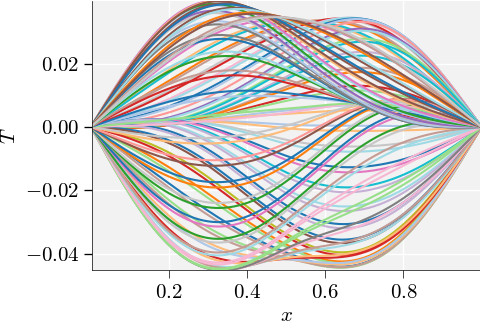

In [36]:
fig, ax = plt.subplots(figsize=(5,3.5))

for i in range(NLS_train_ms.shape[0]):
    Plot = plot(d.xi[0][1:-1], NLS_train_ms[i][1:-1:2], ax=ax)
    Plot.line_()

plt.show()


#### Step 1: Perform SVD on the snapshots (calculate $\mathbb{V}(=\mathbb{W}$)):

Number of modes selected: 11


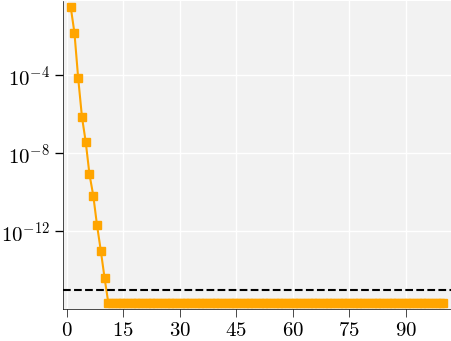

In [37]:
plt.rcParams['figure.dpi'] = 100
n_sel, U = svd_mode_selector(NLS_train_ms, tolerance=1e-15,modes=True)
V_sel = U[:, :n_sel]

In [38]:
V_sel.shape

(500, 11)

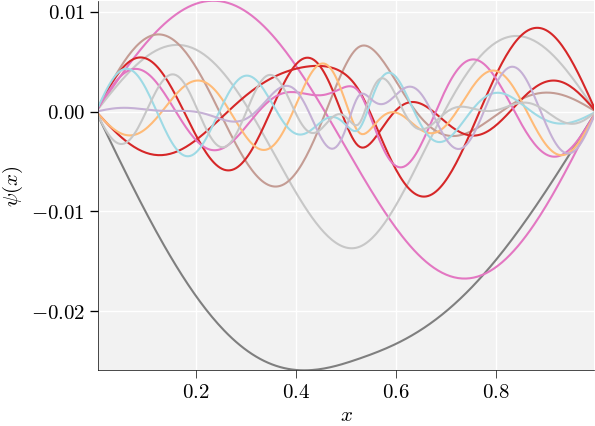

In [39]:
fig, ax = plt.subplots()

for i in range(n_sel):
    Plot = plot(d.xi[0][1:-1], V_sel[1:-1:2,i], ax=ax)
    Plot.line_()

Plot.ax.set_xlabel('$x$')
Plot.ax.set_ylabel('$\psi(x)$')

plt.show()

### Step 2: Perform NNLS for ECSW

In [40]:
_,N_snap_train = np.shape(NLS_wd_train_da)
tol = 1e-13

In [41]:
N_snap_train = solution_snapshot_ecsw.shape[0]*solution_snapshot_ecsw.shape[1]

In [42]:
data = {'K_mus':K_mus,'q_mus':q_mus_truncated, 'C_mus':C_mus}

In [43]:
tic_h_setup_b = time.time()

xi, residual = ecsw_red_SS_parametric(d, V_sel, d.Le, data, n_sel, solution_snapshot_ecsw, NLS_train_mean, Data_cls.FOS.residual_func_p, train_mask_t, tol=tol)

toc_h_setup_b = time.time()

norm of rhs: 22.69335310967754


c:\Users\suparnob\OneDrive - Texas A&M University\Academic\TAMU_MATERIALS\POSTDOC\HYPERREDUCTION\SUPARNO\HYPERREDUCTION__TAMIDS\pyHyperRom\src\codes\algorithms\nnls_scipy.py:135: LinAlgWarning: Ill-conditioned matrix (rcond=1.06683e-16): result may not be accurate.
  s[P] = solve(AtA[P_ind[:, None], P_ind[None, :]], Atb[P],


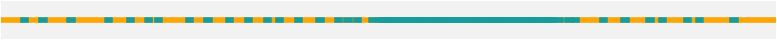

Fraction of total elements active in the ROM: 34.4%
residual=2.1280938173033896e-08


In [44]:
plot(np.arange(d.ncells[0]), xi, ax="").element_()
print(f"Fraction of total elements active in the ROM: {len(xi[xi>0])*100/len(xi)}%")
print(f"{residual=}")

In [45]:
Data_cls.V_sel = V_sel
Data_cls.xi = xi

with open(notebook_dir +'/'+ filename_dataC, 'wb') as file:
    pickle.dump(Data_cls, file, recurse=True)


### ROM Simulation

In [46]:
test_filename_dataC = 'data/test_normal_s_tau_large_16.dill'


with open(notebook_dir+'/'+test_filename_dataC, 'rb') as f:
    Data_cls_test = pickle.load(f)

In [47]:
ROM_h = ROM_simulation_p(Data_cls_test, V_sel, xi, N_rom_snap=16)
ROM_h.run_simulation()

c:\Users\suparnob\AppData\Local\anaconda3\Lib\site-packages\scipy\sparse\linalg\_dsolve\linsolve.py:602: SparseEfficiencyWarning: splu converted its input to CSC format
  return splu(A).solve
c:\Users\suparnob\OneDrive - Texas A&M University\Academic\TAMU_MATERIALS\POSTDOC\HYPERREDUCTION\SUPARNO\HYPERREDUCTION__TAMIDS\pyHyperRom\src\codes\utils\fem_utils_StrucMech.py:385: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  MK_inv = spalg.spsolve(M, K).toarray()
c:\Users\suparnob\OneDrive - Texas A&M University\Academic\TAMU_MATERIALS\POSTDOC\HYPERREDUCTION\SUPARNO\HYPERREDUCTION__TAMIDS\pyHyperRom\src\codes\utils\fem_utils_StrucMech.py:386: SparseEfficiencyWarning: spsolve is more efficient when sparse b is in the CSC matrix format
  MC_inv = spalg.spsolve(M, C).toarray()


In [48]:
ROM = ROM_simulation_p(Data_cls_test, V_sel, N_rom_snap=16)
ROM.run_simulation()

### Performance Statistics

In [49]:
NLS_test = np.asarray(Data_cls_test.NL_solutions)

In [50]:
NLS_rom_h = np.asarray(ROM_h.NL_solutions_rom)
ROM_speed_up_h = ROM_h.speed_up
print(ROM_speed_up_h)

[18.866554668730448, 20.684413794499328, 20.57477352423152, 20.350718703680858, 20.357478730240164, 20.300133599007406, 21.09284348360518, 21.372925362079492, 21.067053568115682, 21.51758024329957, 21.55494465419314, 22.48648451610152, 21.285779053450355, 21.434379198619492, 22.017160151881182, 19.092885799636885]


In [51]:
NLS_rom = np.asarray(ROM.NL_solutions_rom)
ROM_speed_up = ROM.speed_up
print(ROM_speed_up)

[8.998211705017104, 8.046190139578462, 7.940558492795726, 7.711992377088054, 7.874039403225551, 8.147246416552031, 8.008758491682585, 8.01409500504787, 8.085323985602052, 8.042834072769597, 8.136015991634775, 8.209329980751278, 7.750652541776813, 8.128368035292239, 8.409378549737621, 7.881927851187089]


In [52]:
# compare_models(NLS_test[0], ROM_h.NL_solutions_rom[0], t,fc=50)

### Generate UQ plots

In [53]:
# Third-Party Libraries for Data Handling and Visualization
import ptitprince as pt
import pandas as pd

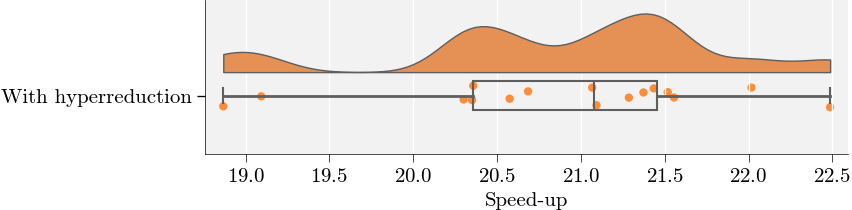

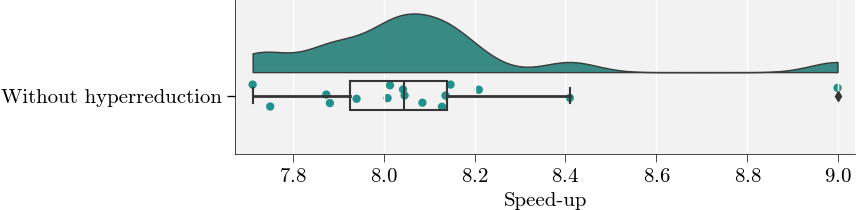

In [54]:
df_C = pd.DataFrame({'':'With hyperreduction','Speed-up':ROM_speed_up_h})
df_D = pd.DataFrame({'':'Without hyperreduction','Speed-up':ROM_speed_up})

# Combine the DataFrames
df2 = pd.concat([df_C, df_D])

fig, ax = plt.subplots(figsize=(8.3, 2))
pt.RainCloud(x = '', y = 'Speed-up', data = df_C, palette = "Oranges",
    width_viol = 1.0, ax = ax, orient = "h",pointplot = False, dodge=True, alpha=1.0, width_box = 0.25, linewidth=1, point_size =6.0)

fig, ax = plt.subplots(figsize=(8, 2))
pt.RainCloud(x = '', y = 'Speed-up', data = df_D, palette = "viridis",
    width_viol = 1.0, ax = ax, orient = "h",pointplot = False, dodge=True, alpha=0.95, width_box = 0.25, linewidth=1, point_size =6.0)
plt.show()

### Generate

Relative error in displacement: 0.07073377852049696
Relative error in velocity: 0.1201067897656829


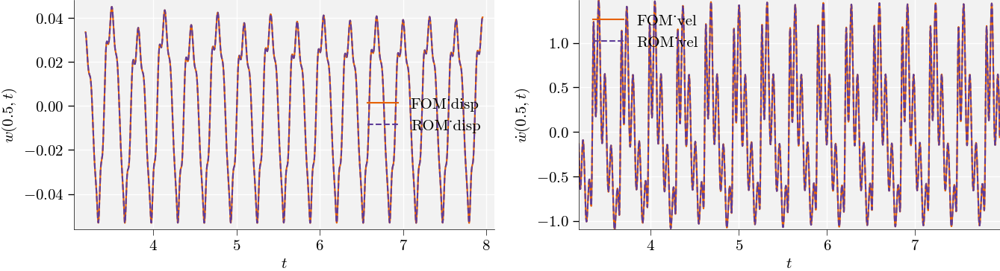

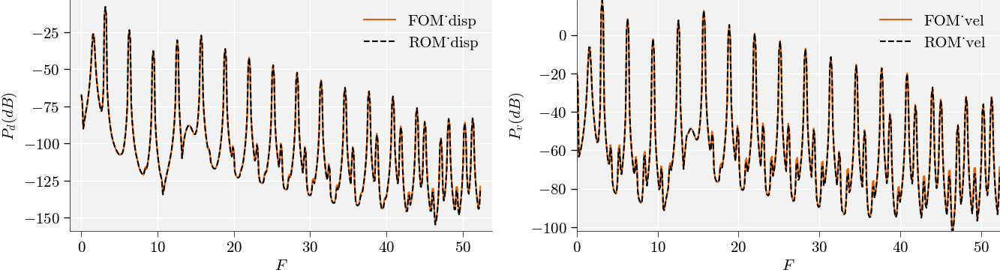

Relative error in displacement: 0.07072382070076008
Relative error in velocity: 0.12010043104248286


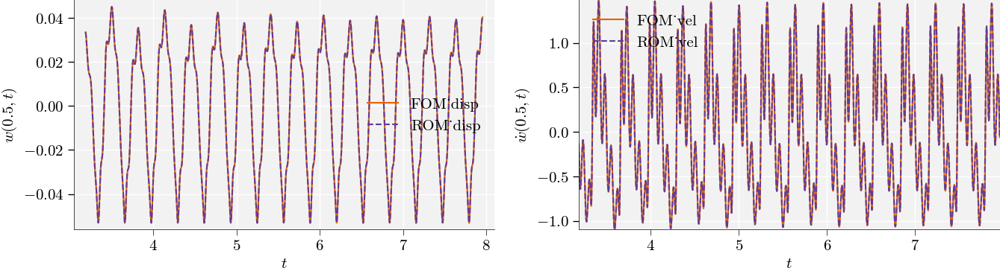

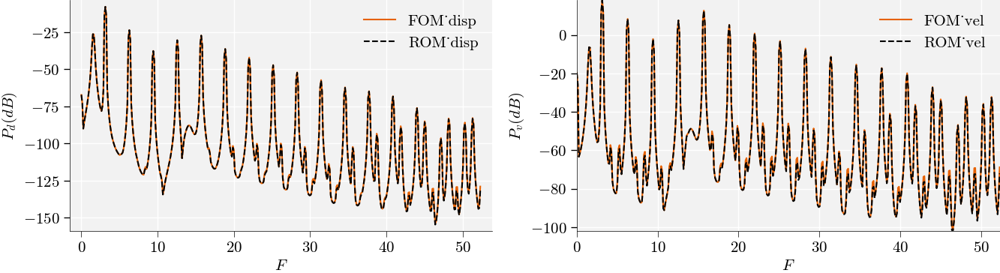

Relative error in displacement: 0.6473646380523617
Relative error in velocity: 0.6486053694789713


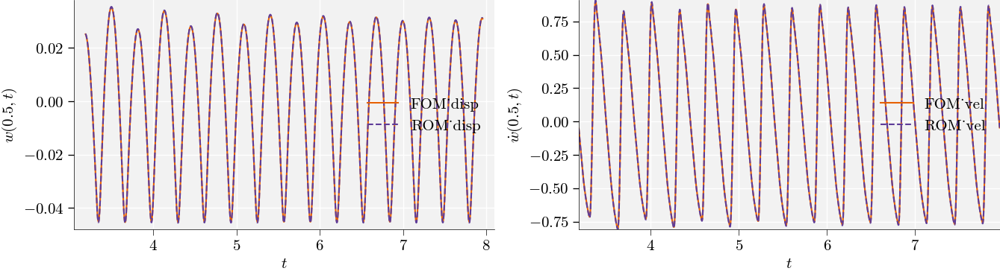

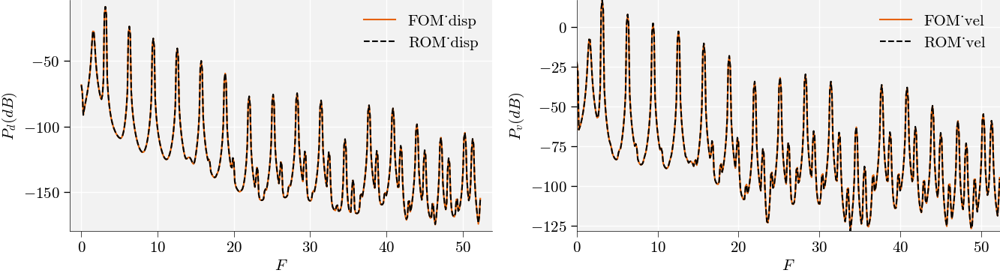

Relative error in displacement: 0.03601751204848733
Relative error in velocity: 0.036056436301679956


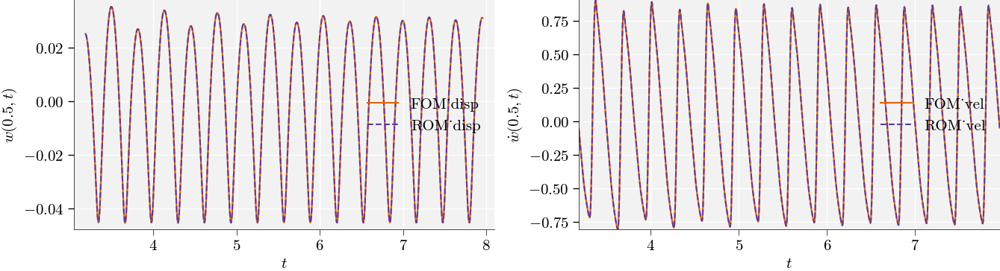

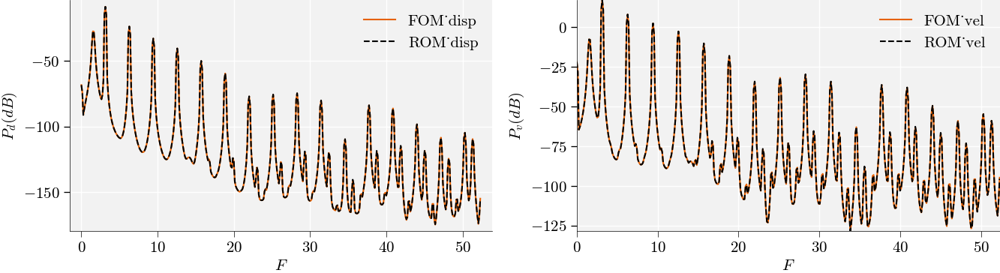

Relative error in displacement: 0.05167248413213233
Relative error in velocity: 0.05088337867941855


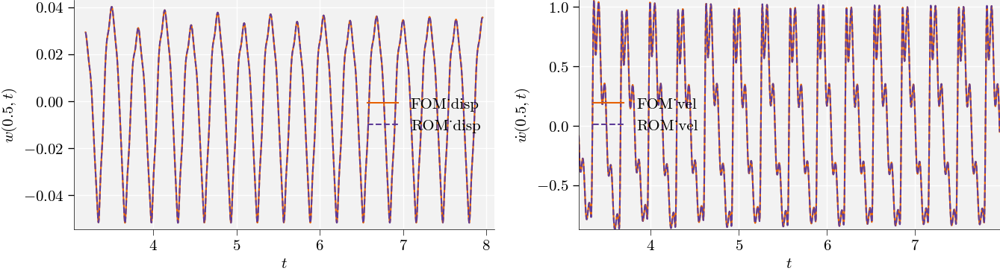

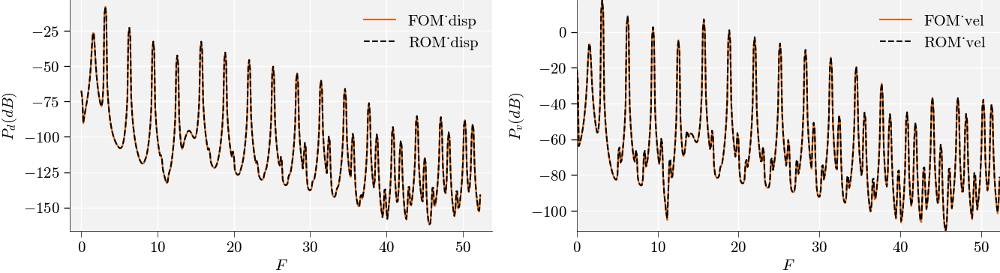

Relative error in displacement: 0.05166091530806981
Relative error in velocity: 0.050866780843477434


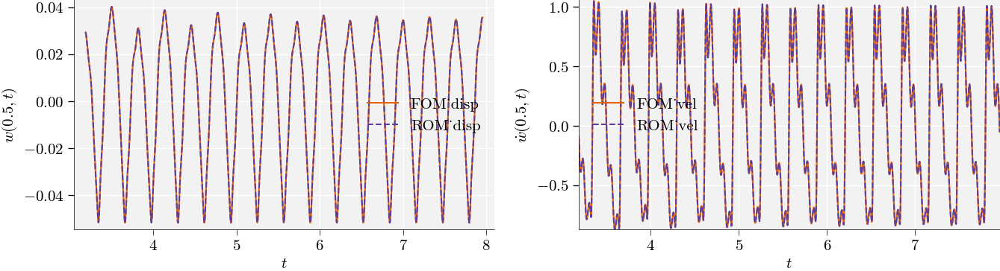

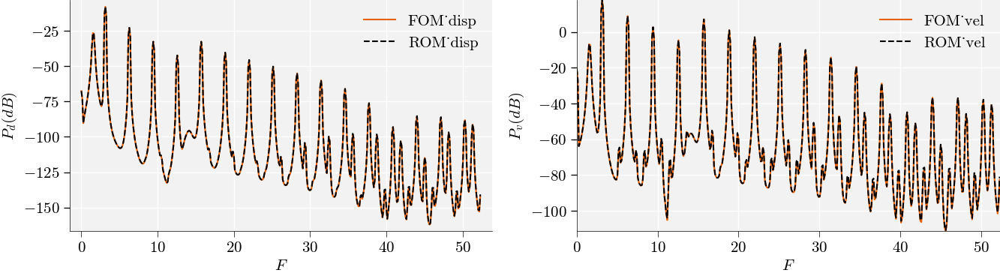

Relative error in displacement: 0.05199969691729851
Relative error in velocity: 0.06243985101410508


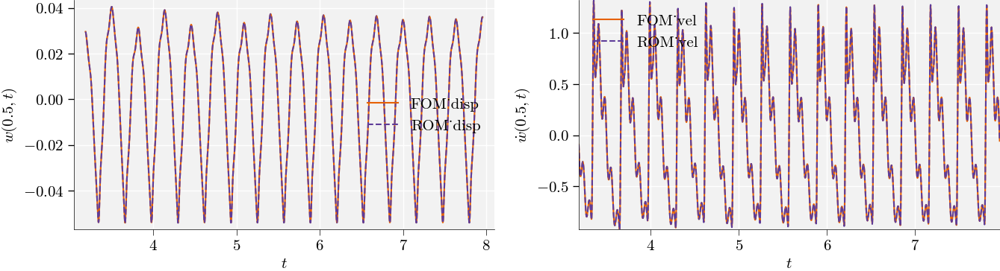

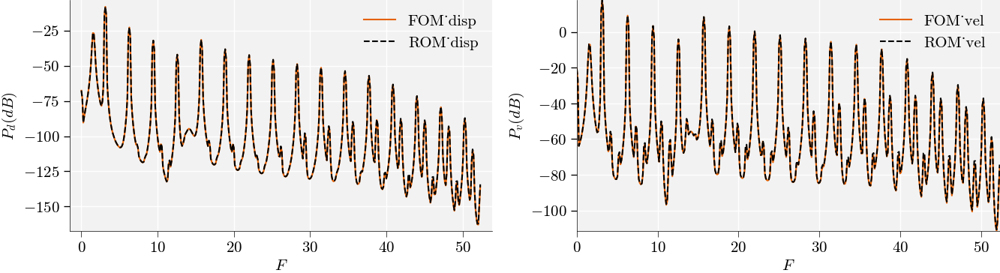

Relative error in displacement: 0.05198760675298582
Relative error in velocity: 0.06242637490255697


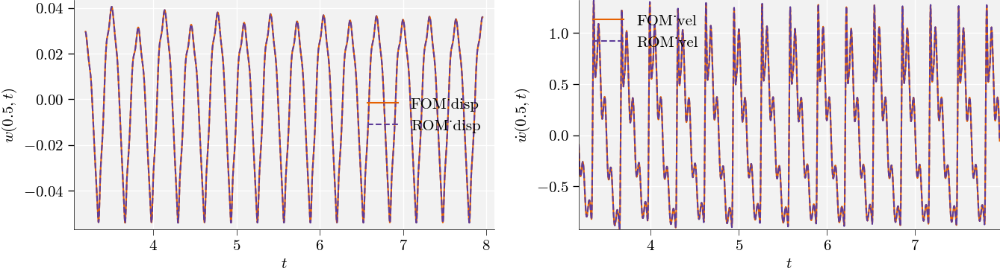

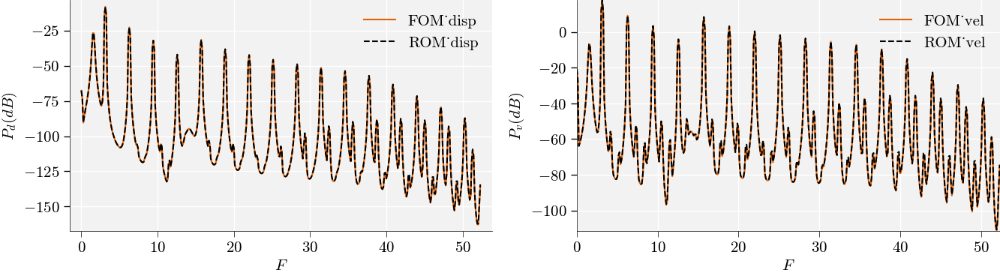

Relative error in displacement: 0.07067850229630014
Relative error in velocity: 0.058841232283185094


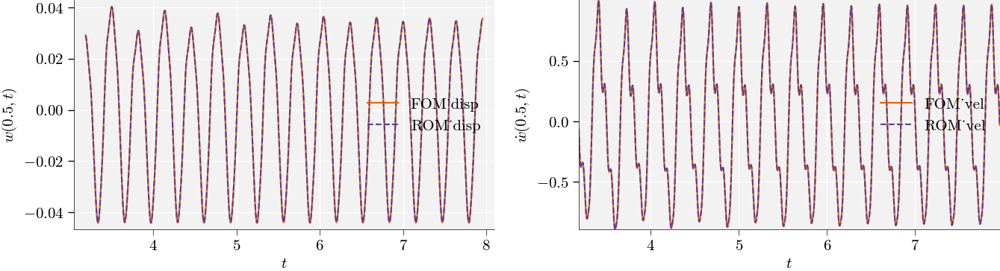

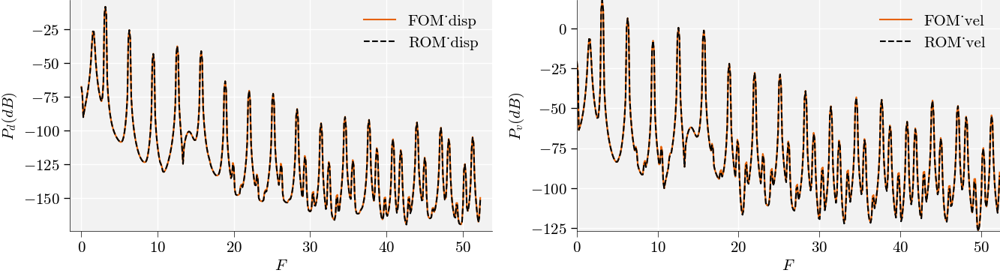

Relative error in displacement: 0.06980500362174949
Relative error in velocity: 0.058236536343174314


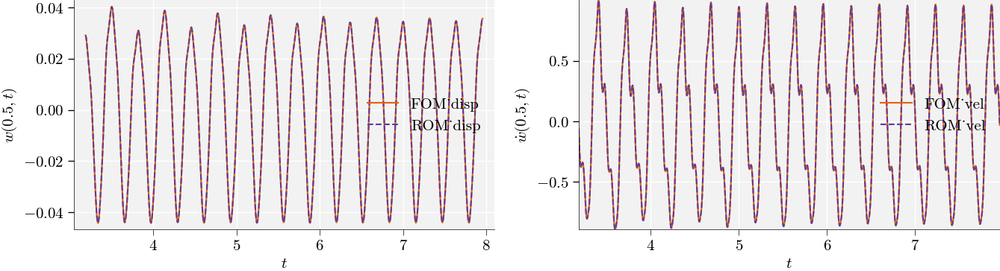

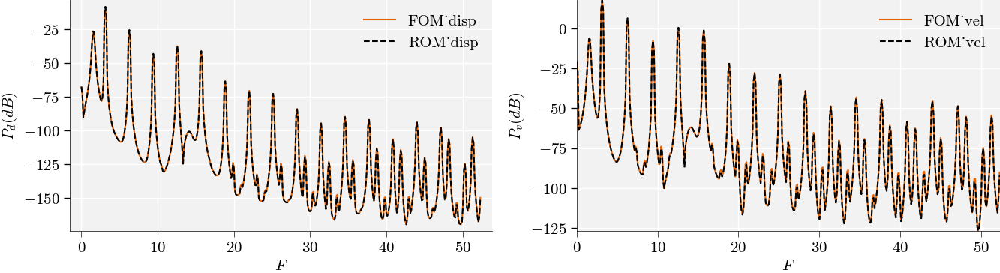

Relative error in displacement: 0.05859738627893872
Relative error in velocity: 0.046463629694323084


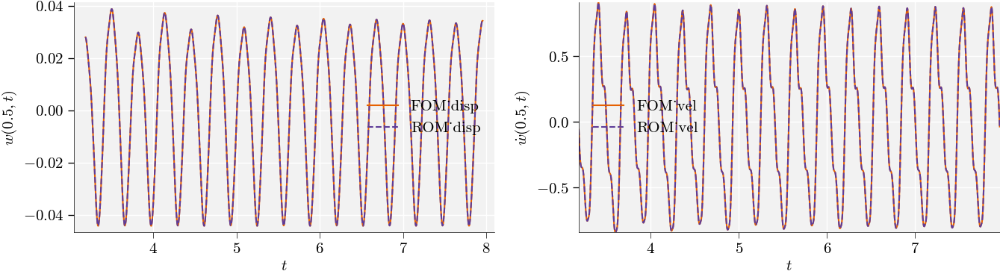

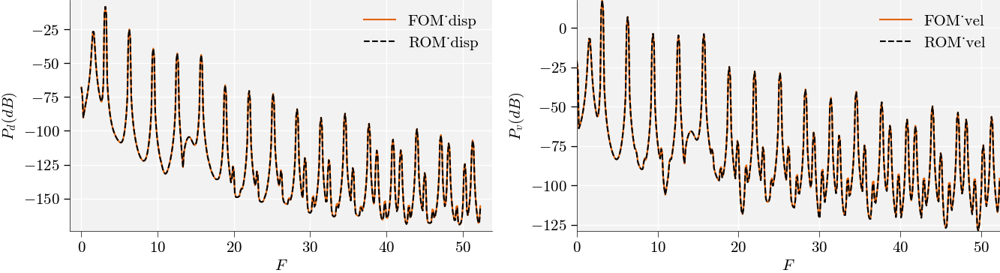

Relative error in displacement: 0.05860135773567136
Relative error in velocity: 0.046451855989726204


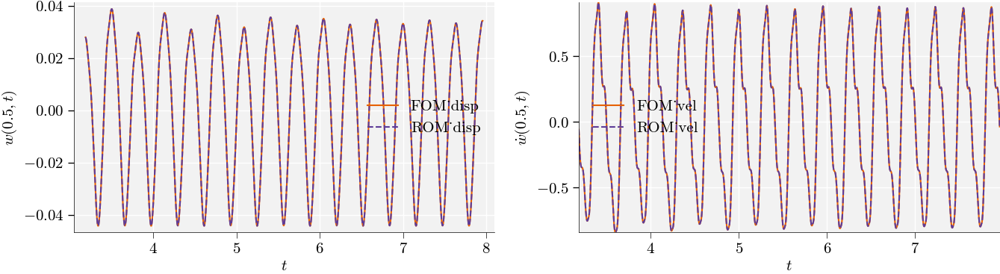

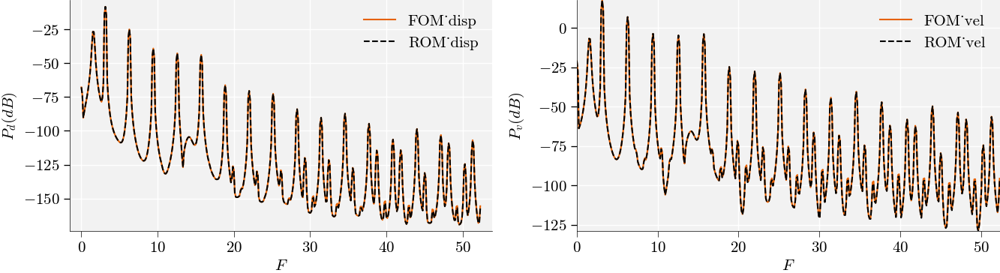

Relative error in displacement: 0.06026779680884583
Relative error in velocity: 0.05014252137175719


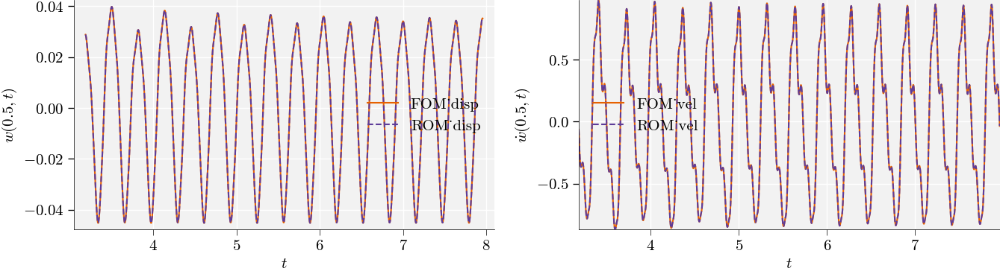

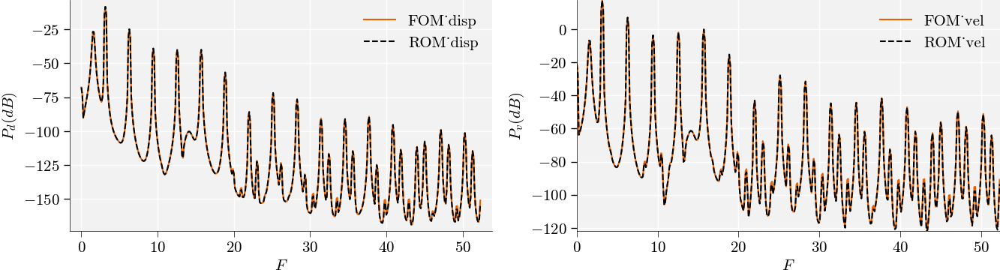

Relative error in displacement: 0.06037410707735387
Relative error in velocity: 0.05014565795995058


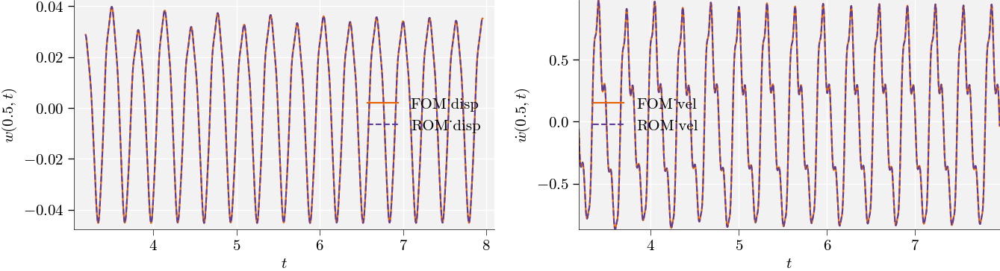

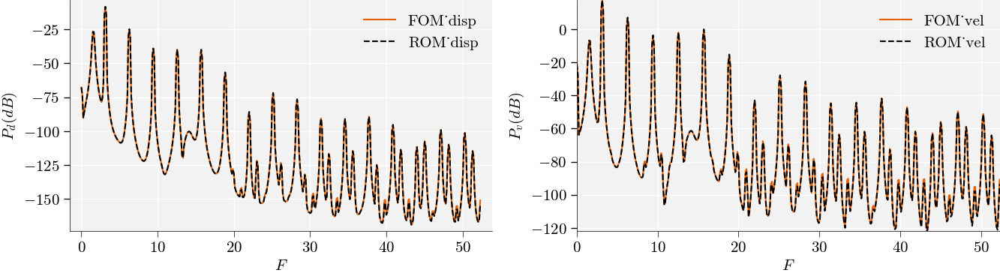

Relative error in displacement: 0.06717972257236346
Relative error in velocity: 0.0671999238386489


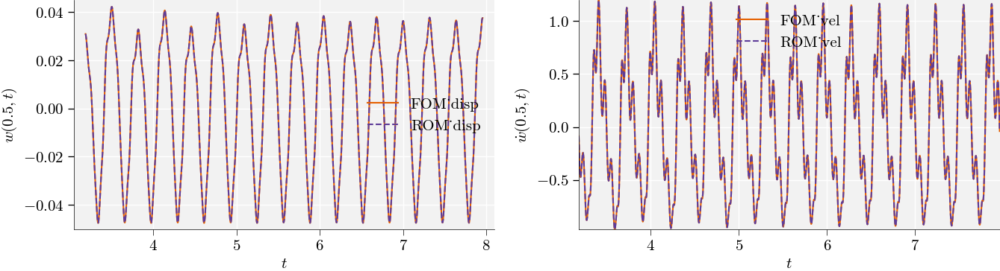

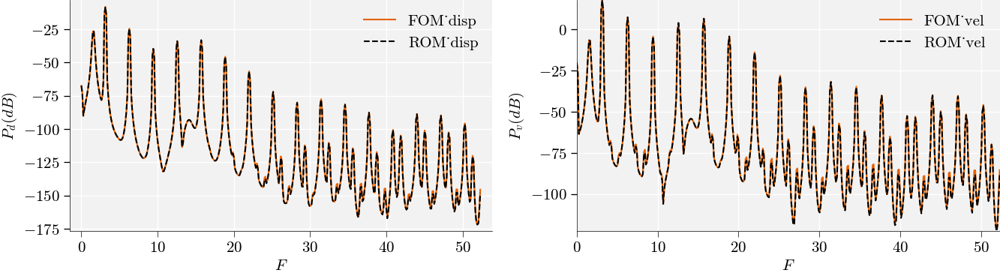

Relative error in displacement: 0.06716844112913377
Relative error in velocity: 0.06718789568215829


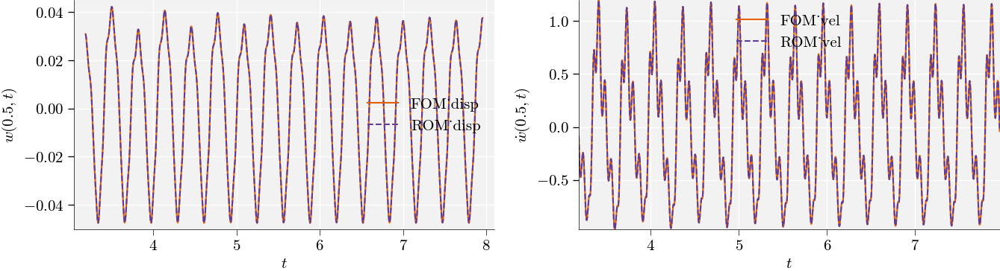

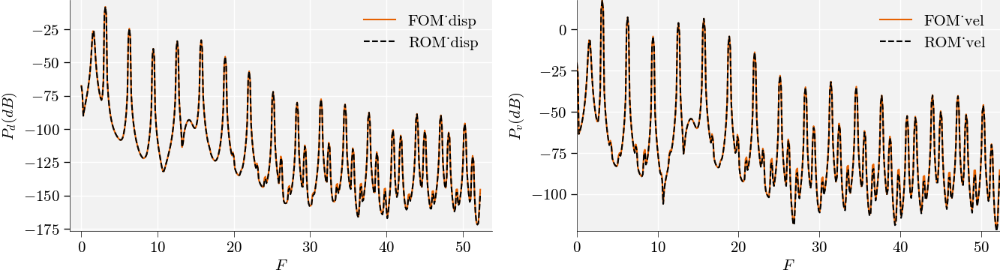

Relative error in displacement: 0.06602832861386104
Relative error in velocity: 0.05463662262518522


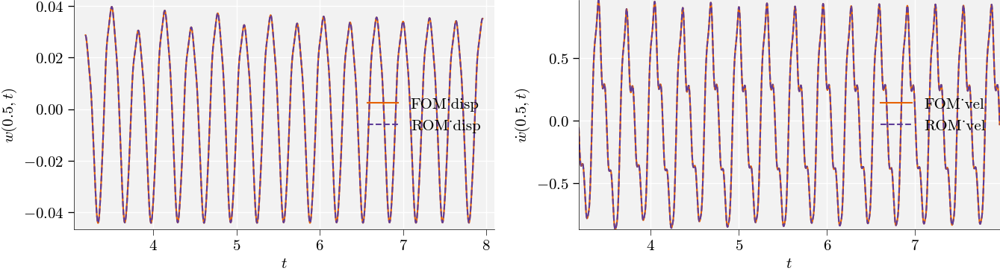

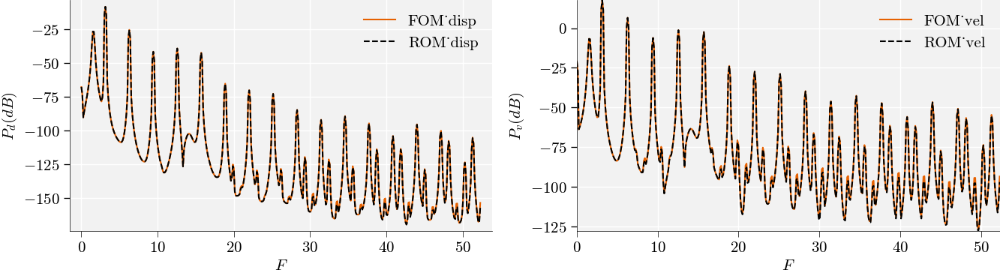

Relative error in displacement: 0.06602093473099699
Relative error in velocity: 0.05462348461731762


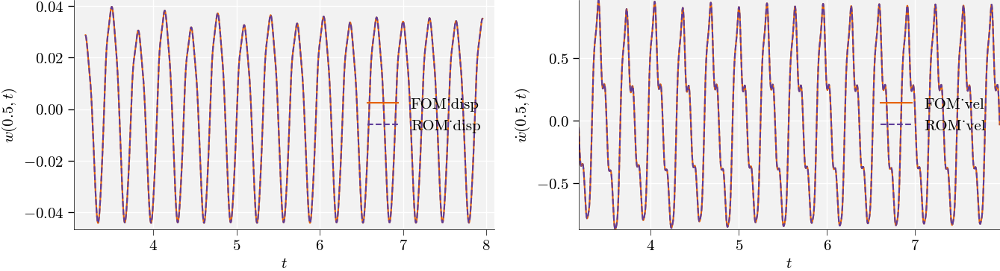

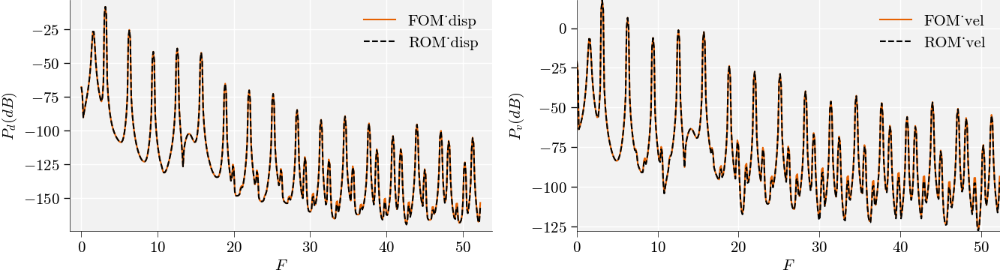

Relative error in displacement: 0.478766428169886
Relative error in velocity: 0.4811208672276038


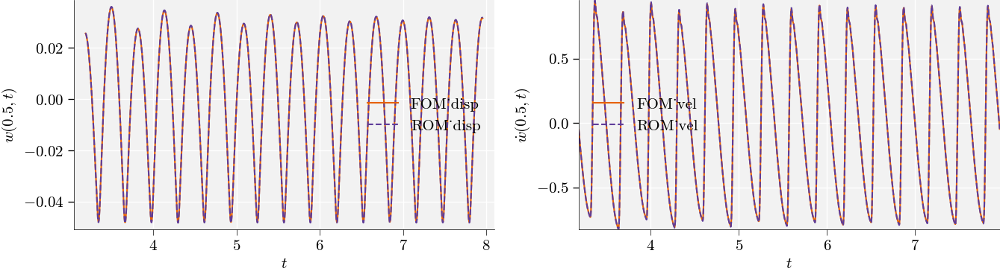

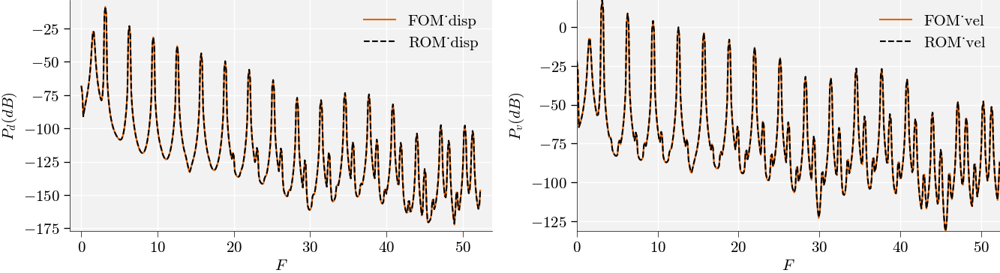

Relative error in displacement: 0.036726929722666404
Relative error in velocity: 0.043907653593122604


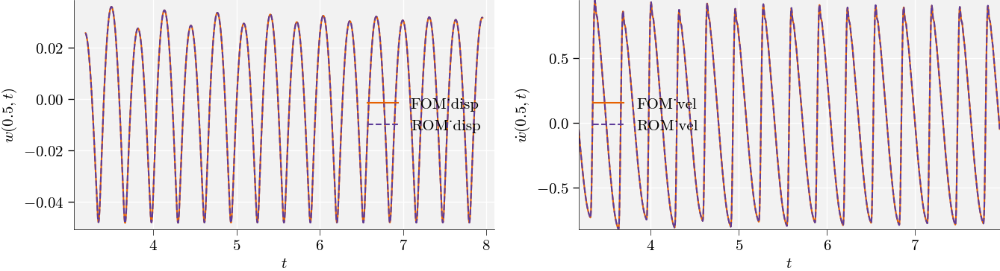

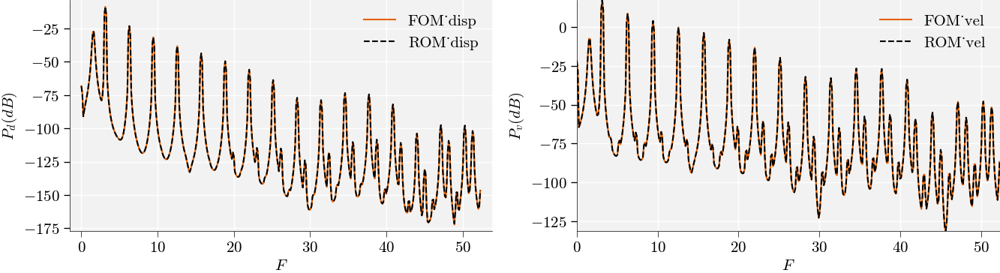

Relative error in displacement: 0.03806335940210451
Relative error in velocity: 0.034747145041267476


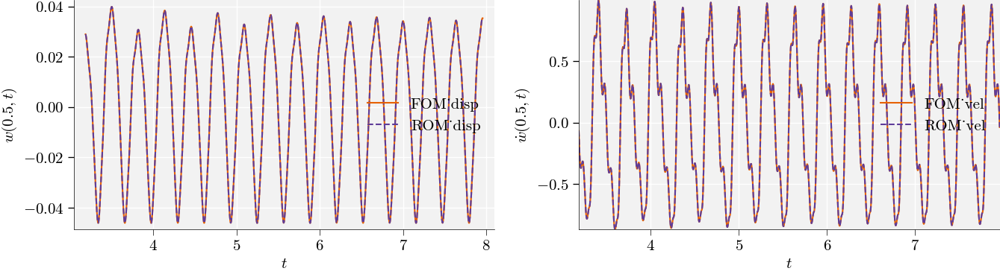

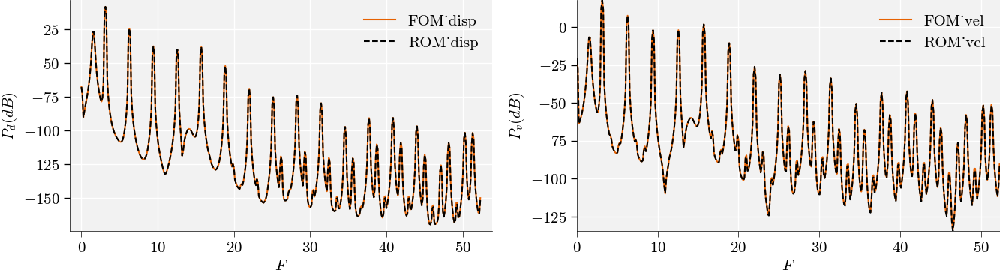

Relative error in displacement: 0.037933005194278245
Relative error in velocity: 0.034690266561455116


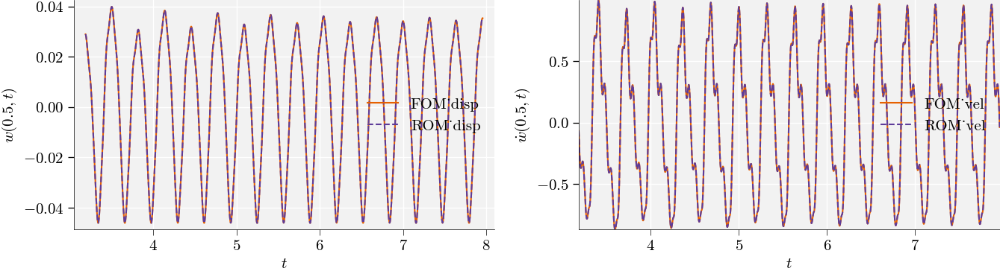

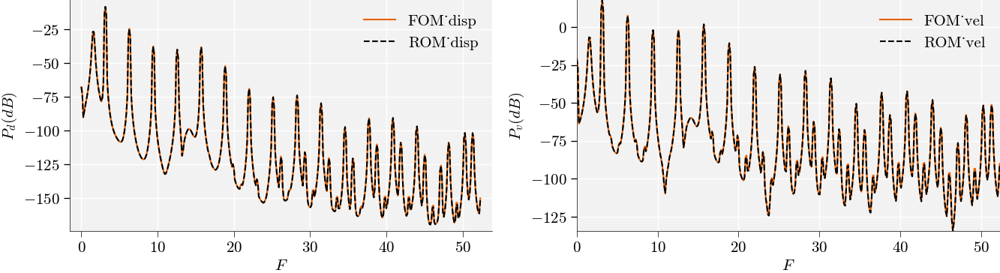

Relative error in displacement: 0.03522563812243318
Relative error in velocity: 0.034335108613435486


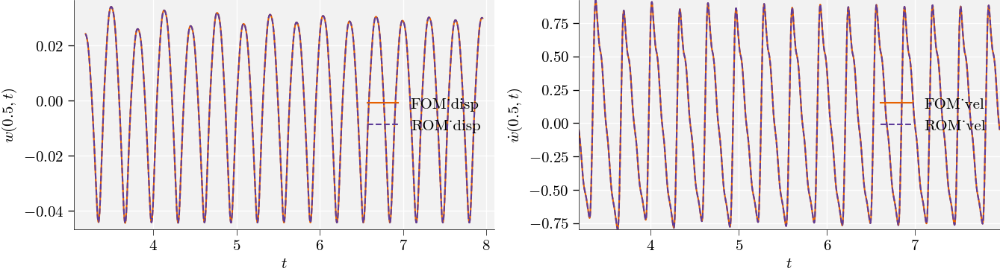

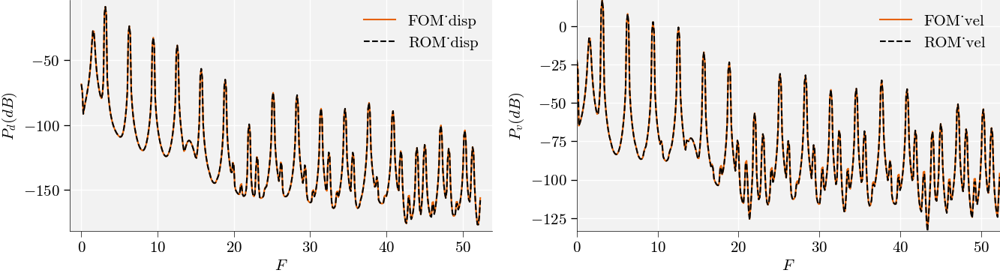

Relative error in displacement: 0.03520997615890074
Relative error in velocity: 0.03433953362972271


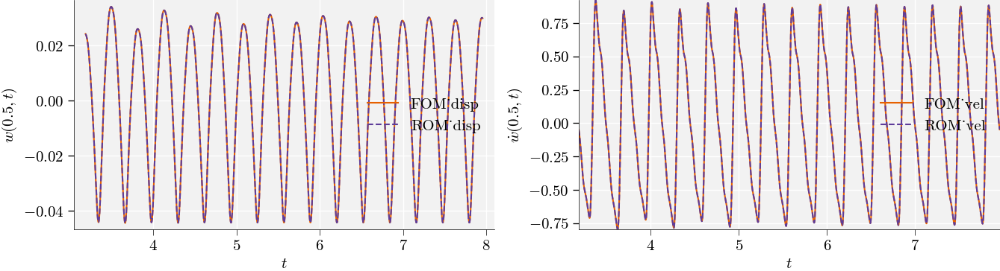

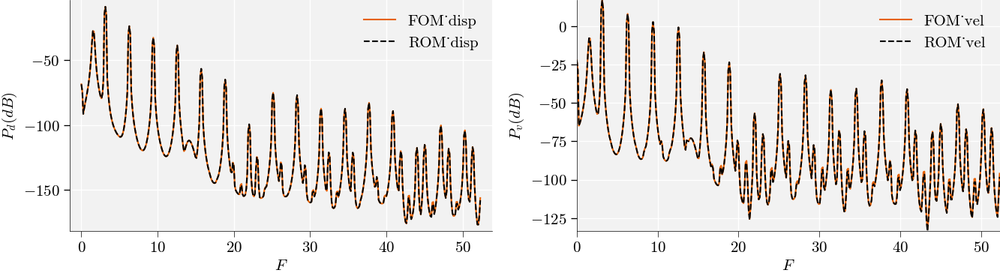

Relative error in displacement: 0.08856233013283812
Relative error in velocity: 0.08537624322950935


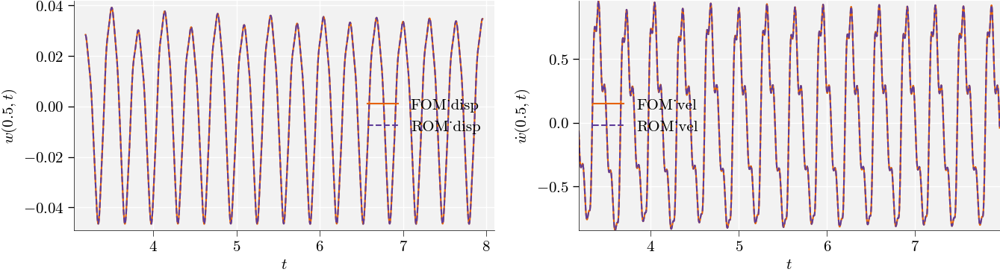

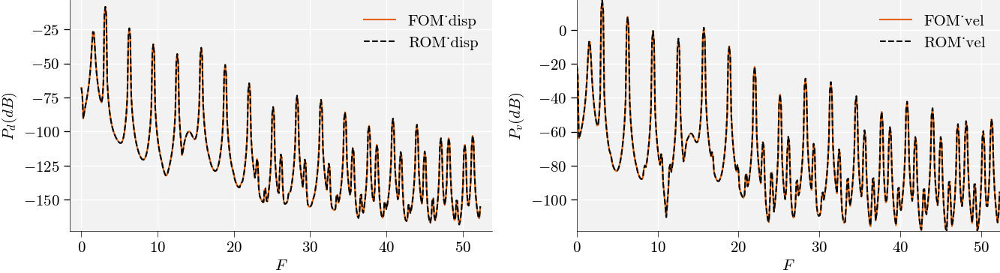

Relative error in displacement: 0.053663030852973026
Relative error in velocity: 0.04420456188083389


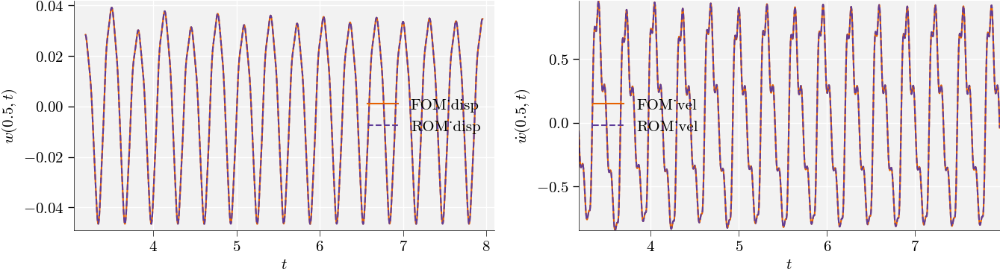

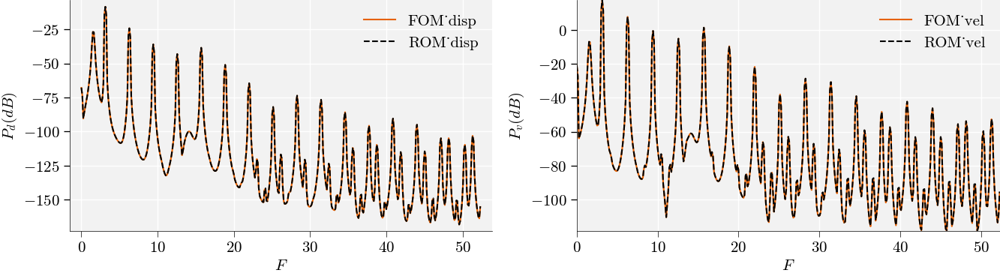

Relative error in displacement: 0.062129335541159715
Relative error in velocity: 0.1546115949870948


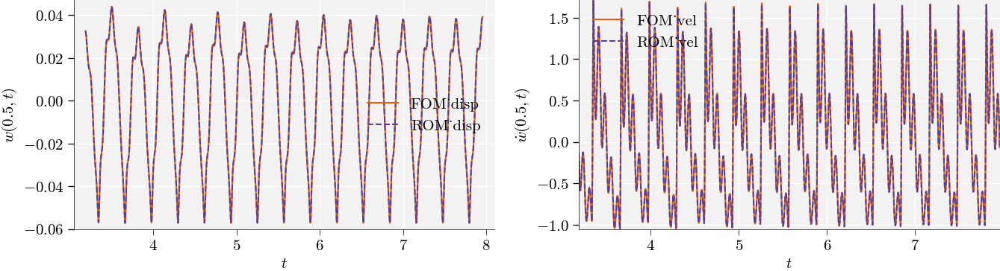

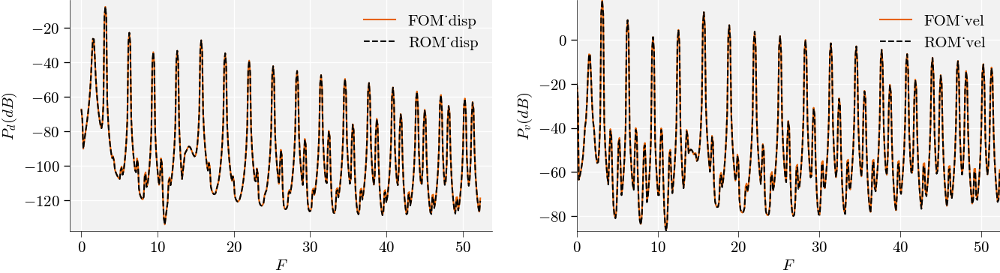

Relative error in displacement: 0.06215513982926941
Relative error in velocity: 0.1546088856306592


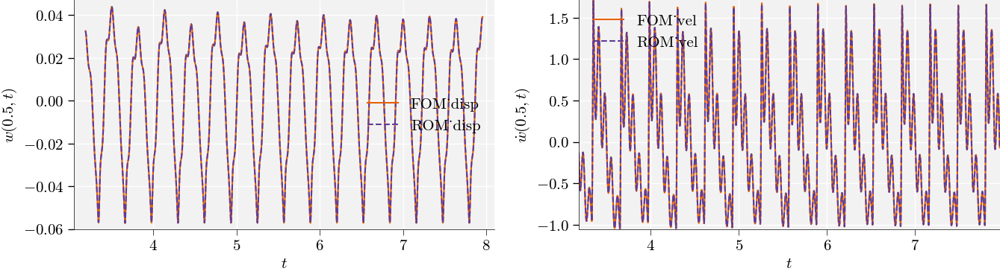

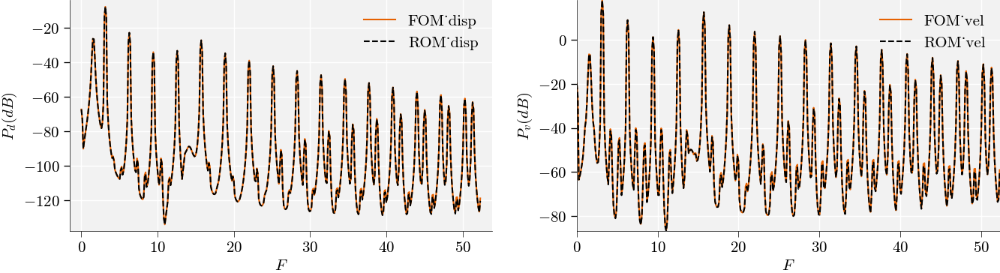

Relative error in displacement: 0.07011459651557175
Relative error in velocity: 0.04624023943336028


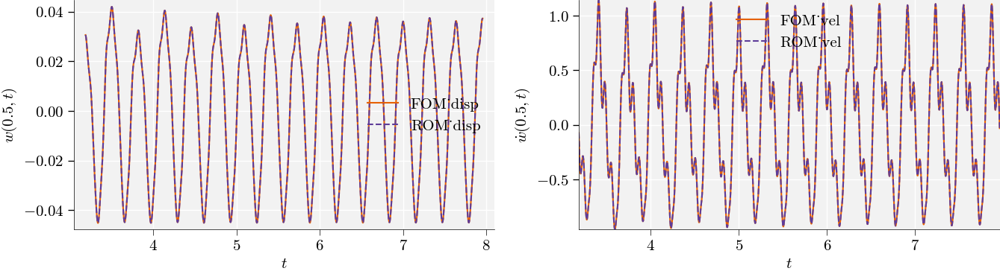

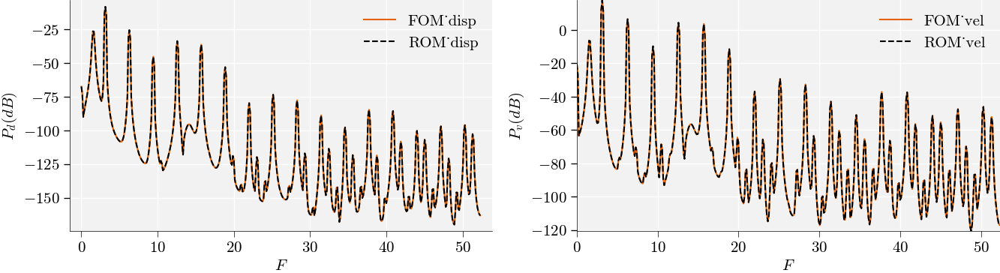

Relative error in displacement: 0.07049197805965193
Relative error in velocity: 0.04654392985849086


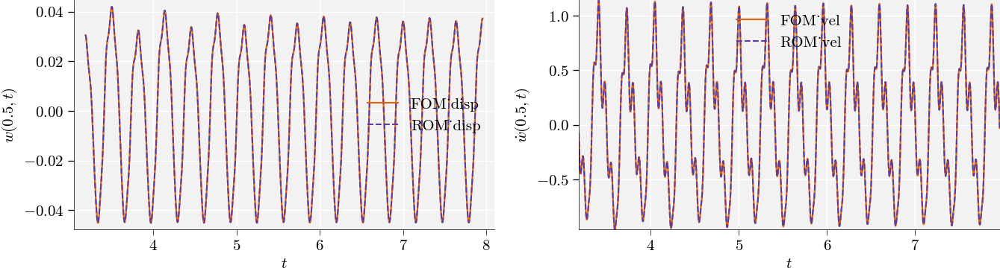

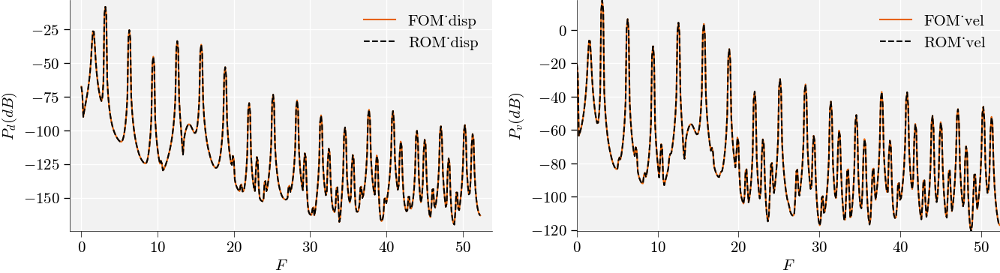

Relative error in displacement: 0.05780669789345443
Relative error in velocity: 0.04912827931710499


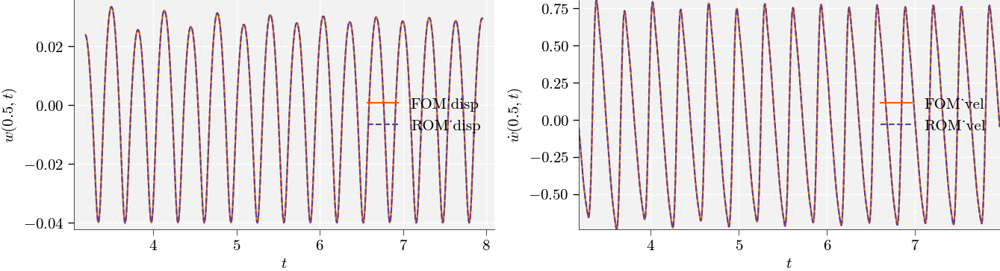

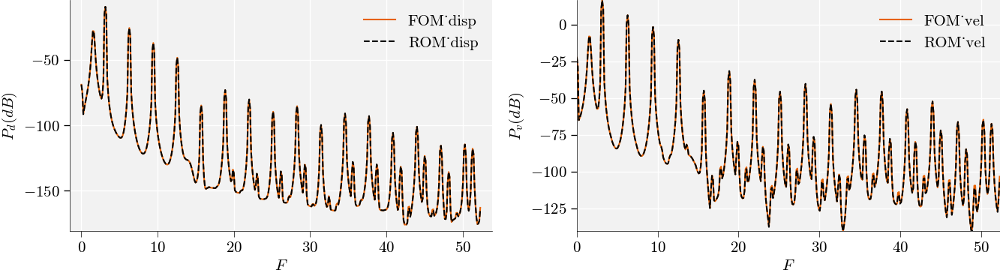

Relative error in displacement: 0.0539117272471035
Relative error in velocity: 0.04526637060615025


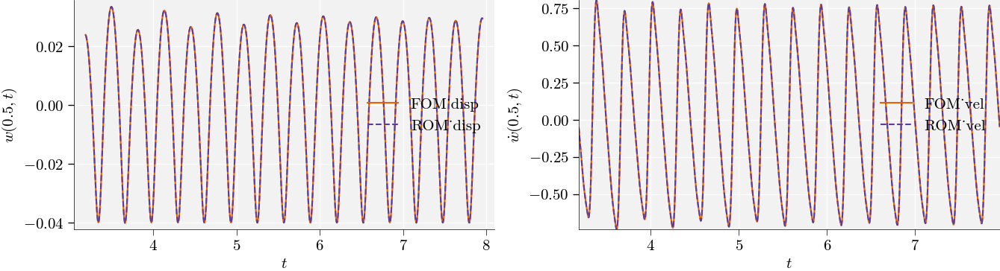

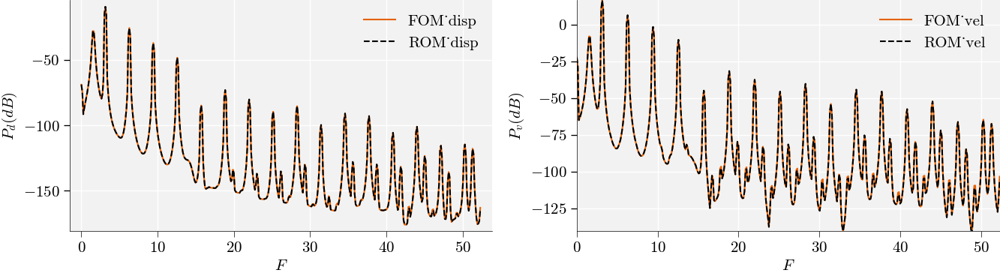

In [55]:
err_d =[]
err_v = []

err_d_ROM =[]
err_v_ROM = []


for j in range(len(NLS_test)):
    ed,ev = compare_models(NLS_test[j], ROM_h.NL_solutions_rom[j], t,fc=50)
    err_d.append(ed)
    err_v.append(ev)

    ed_rom,ev_rom = compare_models(NLS_test[j], ROM.NL_solutions_rom[j], t,fc=50)
    err_d_ROM.append(ed_rom)
    err_v_ROM.append(ev_rom)


Model_error_d.append(err_d)
Model_error_v.append(err_v)

Model_error_ROM_d.append(err_d_ROM)
Model_error_ROM_v.append(err_v_ROM)

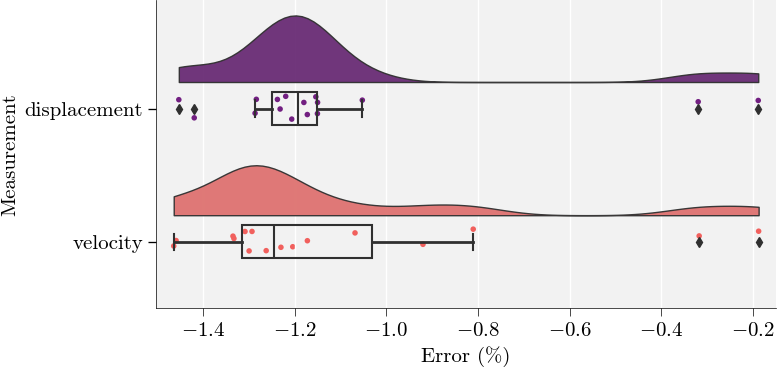

In [56]:
# Create DataFrames
df_a = pd.DataFrame({
    'Measurement': ['displacement'] * len(err_d),
    'Error (%)': np.log10(np.abs(err_d))  # Taking log10 of the absolute values
})
df_b = pd.DataFrame({
    'Measurement': ['velocity'] * len(err_v),
    'Error (%)': np.log10(np.abs(err_v))  # Taking log10 of the absolute values
})

# Combine the DataFrames
df_combined = pd.concat([df_a, df_b])

# Create a RainCloud plot
fig, ax = plt.subplots(figsize=(8, 4))
pt.RainCloud(x='Measurement', y='Error (%)', data=df_combined, palette="magma",
             width_viol=1.0, ax=ax, orient="h", pointplot=False, dodge=True, alpha=0.95, width_box=0.25, linewidth=1, point_size=4.0)
plt.show()

In [55]:
if N_snap==32:

    # os.chdir(notebook_dir)
    Model_error_v.reverse()
    Model_error_ROM_v.reverse()

    # np.save(f'data/{method}_sampling_ecsw.npy',[Model_error_d, Model_error_v])
    # np.save(f'data/{method}_sampling.npy',[Model_error_ROM_d, Model_error_ROM_v])

    # tdata = np.load('data/ep_normal_sampling.npy')
    # tdata2 = np.load('Epistemic/normal_sampling_ecsw.npy')

    positions = np.array([2,4,8,16,32])
    # range(5,85,5)  # Positions for each box plot on the x-axis
    plt.rcParams['xtick.labelsize'] = 15 # For legend text
    plt.rcParams['ytick.labelsize'] = 15 # For legend text

    fig, ax_box = plt.subplots(figsize=(16, 6))
    from matplotlib.ticker import MaxNLocator

    ax_box.set_facecolor('#f5f5f5')
    # Create Box Plot with patch_artist=True

    boxprops = dict(linewidth=2.0, color='#2f837f', facecolor='#2f837f')
    meanprops = dict(marker='^', markeredgecolor='white', markersize = 3, markerfacecolor='white')

    box = ax_box.boxplot(Model_error_ROM_v, vert=False, patch_artist=True, widths=0.9,
                            boxprops=boxprops,
                            whiskerprops=dict(linewidth=1.0, color='#2f837f'),
                            capprops=dict(linewidth=2.0, color='#2f837f'),
                            medianprops=dict(linewidth=2.0, color='white'),
                            meanprops=meanprops,
                            positions=positions,
                            showmeans=True,
                            flierprops=dict(marker='.', markerfacecolor='#2f837f', markeredgecolor='#2f837f', markersize=3, linestyle='none'))


    boxprops = dict(linewidth=2.0, color='orange', facecolor='orange')
    meanprops = dict(marker='^', markeredgecolor='white', markersize = 3, markerfacecolor='white')

    box = ax_box.boxplot(Model_error_v, vert=False, patch_artist=True, widths=0.9,
                            boxprops=boxprops,
                            whiskerprops=dict(linewidth=1.0, color='orange'),
                            capprops=dict(linewidth=2.0, color='orange'),
                            medianprops=dict(linewidth=2.0, color='white'),
                            meanprops=meanprops,
                            positions=positions,
                            showmeans=True,
                            flierprops=dict(marker='.', markerfacecolor='#ffb300', markeredgecolor='#ffb300', markersize=3, linestyle='none'))


    # Remove unwanted spines and ticks from the boxplot
    # ax_box.set_yticks([2,4,8,16,32])
    plt.xscale('log')
    # plt.yscale('log')
    ax_box.spines['top'].set_visible(False)
    ax_box.spines['bottom'].set_visible(True)
    ax_box.spines['right'].set_visible(False)
    ax_box.spines['left'].set_visible(True)
    ax_box.set_xlabel('Relative velocity error (log)')
    ax_box.set_ylabel('No. of snapshots')
    # plt.gca().yaxis.set_major_locator(MaxNLocator(5))
    # ax_box.set_yticklabels(['','','8','4','','2'])

    # Adjusting axis limits to increase the gap
    y_min, y_max = 2, 32
    y_range = y_max - y_min
    ax_box.set_ylim(y_min - 0.1 * y_range, y_max + 0.1 * y_range)  # Adding 10% padding at both ends of the y-axis

    ax_box.invert_yaxis()
    # clr = '#5a2641'
    # ax_box.annotate('Snapshots: 2',xy=(0.009,31.5),xytext=(0.009,31.5),color=clr)
    # ax_box.annotate('4',xy=(0.03,31.5/2-0.2),xytext=(0.03,31.5/2-0.2),color=clr)
    # ax_box.annotate('8',xy=(0.03,31.5/4-0.5),xytext=(0.03,31.5/4-0.5),color=clr)
    # ax_box.annotate('16',xy=(0.03,31.5/8 -0.4),xytext=(0.03,31.5/8 -0.4),color=clr)
    # ax_box.annotate('32',xy=(0.03,31.5/16-0.5),xytext=(0.03,31.5/16-0.5),color=clr)

    plt.savefig(f'{method}_error_hist.png')
